In [ ]:
from tardis_em.utils.visualize_pc import VisualizePointCloud
coord_straight = straight_line_3d(25)
coord_curve = curve_pi_3d(25)
print(np.round(np.mean(curvature(coord_curve, False, None)), 10))
# VisualizePointCloud(coord_curve, False)

In [ ]:
coord_straight

In [3]:
from tardis_em.utils.load_data import load_image
from tardis_em.utils.visualize_pc import show_image_list

img, px = load_image(
    "../../../../test_tirf/movie/2024-10-14_TTLL11_212-800_100nM_005.nd2")
# img = [i for i in img]

In [6]:
frames = img[1, 0, ...]

from .

(array([2.30000e+01, 2.30500e+03, 3.13170e+05, 8.05335e+05, 2.85913e+05,
        4.51500e+03, 4.10000e+01, 1.20000e+01, 1.00000e+01, 4.00000e+00]),
 array([14574. , 15587.5, 16601. , 17614.5, 18628. , 19641.5, 20655. ,
        21668.5, 22682. , 23695.5, 24709. ]),
 <BarContainer object of 10 artists>)

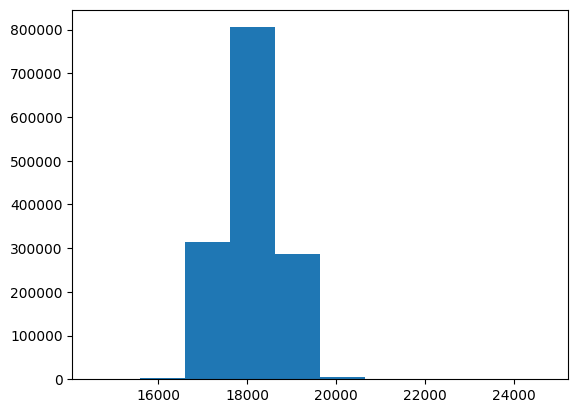

In [7]:
import matplotlib.pyplot as plt

plt.hist(img[0].flatten())

In [4]:
import torch

torch.cuda.is_available()

NameError: name '_C' is not defined

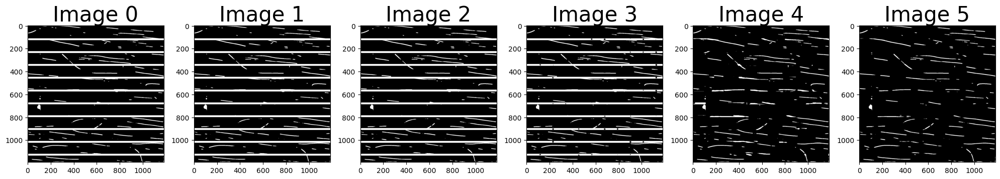

In [7]:
img, px = load_image(
    "../../../../test/Predictions/231110_JanelTTLL11_212-800_100nM_010_no_salt_semantic.mrc"
)
img = [i for i in img]
show_image_list(img, grid=False, num_cols=6)

In [1]:
import numpy as np

idx = [
    int(i)
    for i in "112  113  114  115  116  117  118  119  120  121  122  123  124  125  \
126  127  224  225  226  227  228  229  230  231  232  233  234  235  \
236  237  238  239  336  337  338  339  340  341  342  343  344  345  \
346  347  348  349  350  351  448  449  450  451  452  453  454  455  \
456  457  458  459  460  461  462  463  560  561  562  563  564  565  \
566  567  568  569  570  571  572  573  574  575  672  673  674  675  \
676  677  678  679  680  681  682  683  684  685  686  687  784  785  \
786  787  788  789  790  791  792  793  794  795  796  797  798  799  \
896  897  898  899  900  901  902  903  904  905  906  907  908  909  \
910  911  1008  1009  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019 \
 1020  1021  1022  1023  1120  1121  1122  1123  1124  1125  1126  1127  1128  1129 \
 1130  1131  1132  1133  1134  1135".split(
        "  "
    )
]
# idx = np.array(idx)[:, ]
# idx.shape

In [2]:
import numpy as np
from tardis_em.cnn.data_processing.stitch import StitchImages
from tardis_em.utils.visualize_pc import show_image_list

output = "../../../../test/temp/Patches/imgs"
image_stitcher = StitchImages()

image = image_stitcher(
    image_dir=output,
    mask=False,
    dtype=np.float32,
)
# image[:, idx, :] = image[:, idx, :] / 2
# image[..., idx] = image[..., idx] / 2
image = [i for i in image]
# image[..., idx].shape
# show_image_list([image[0][:150, :150]], grid=False, num_cols=6)

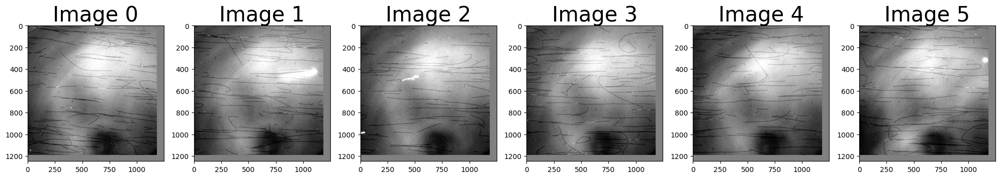

In [3]:
show_image_list(image, grid=False, num_cols=6)

(array([ 45674.,  79673., 124074., 150226., 349907., 477509., 125049.,
         86257.,  62755.,  56380.]),
 array([-1.        , -0.80000001, -0.60000002, -0.39999998, -0.19999999,
         0.        ,  0.20000005,  0.39999998,  0.60000002,  0.80000007,
         1.        ]),
 <BarContainer object of 10 artists>)

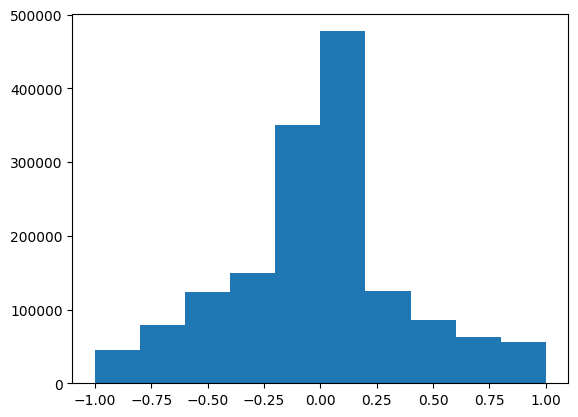

In [16]:
import matplotlib.pyplot as plt

plt.hist(image[0].flatten())

In [2]:
from tardis_em.utils.load_data import load_image
import numpy as np
from tardis_em.utils.normalization import RescaleNormalize, MinMaxNormalize

from tardis_em.cnn.data_processing.stitch import StitchImages
import torch

norm = RescaleNormalize()

In [3]:
org_img, org_px = load_image("../../../../CZI_Gallery/scaling/ycw2012-10-08-4.mrc")
org_img = norm(org_img)

segmented = np.load("../../../../CZI_Gallery/scaling/ycw2012-10-08-4_cnn_raw.npy")
segmented_sigmoid = np.load("../../../../CZI_Gallery/scaling/ycw2012-10-08-4_cnn.npy")

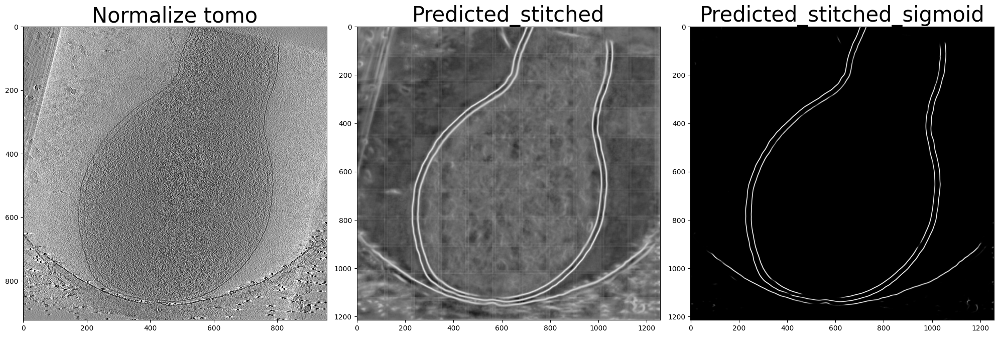

In [4]:
from tardis_em.utils.visualize_pc import show_image_list
from tardis_em.utils.normalization import RescaleNormalize

org_slice = 250
slice_ = int(org_slice * (org_px / 15))

org_slice = org_img[org_slice, :]


show_image_list(
    [org_slice, segmented[slice_, :], segmented_sigmoid[slice_, :]],
    list_titles=["Normalize tomo", "Predicted_stitched", "Predicted_stitched_sigmoid"],
    num_cols=3,
    grid=False,
)

# Scaling or Tomogram file

In [9]:
from tardis_em.cnn.data_processing.scaling import (
    linear_scaling,
    area_scaling,
    nn_scaling,
    fourier_scaling,
)

test_img = org_img[150:350, 600:, :600]
test_img.shape

# Upsample to 8A
up_sample = tuple(np.multiply(test_img.shape, org_px / 8).astype(np.uint16))
print(f"Up: {up_sample}")

org_up_linear = linear_scaling(test_img, up_sample)
org_up_area = area_scaling(test_img, up_sample)
org_up_nn = nn_scaling(test_img, up_sample)
org_up_nng = nn_scaling(test_img, up_sample, gauss=True)
# org_up_fft = fourier_scaling(test_img, up_sample,)
#
# # Downsample to 25A
down_sample = tuple(np.multiply(test_img.shape, org_px / 35).astype(np.uint16))
print(f"Down: {down_sample}")
#
org_down_linear = linear_scaling(test_img, down_sample)
org_down_area = area_scaling(test_img, down_sample)
org_down_nn = nn_scaling(test_img, down_sample)
org_down_nng = nn_scaling(test_img, down_sample, gauss=True)
# org_down_fft = fourier_scaling(test_img, down_sample)

Up: (np.uint16(493), np.uint16(799), np.uint16(1479))
Down: (np.uint16(112), np.uint16(182), np.uint16(338))


1.7857142857142858


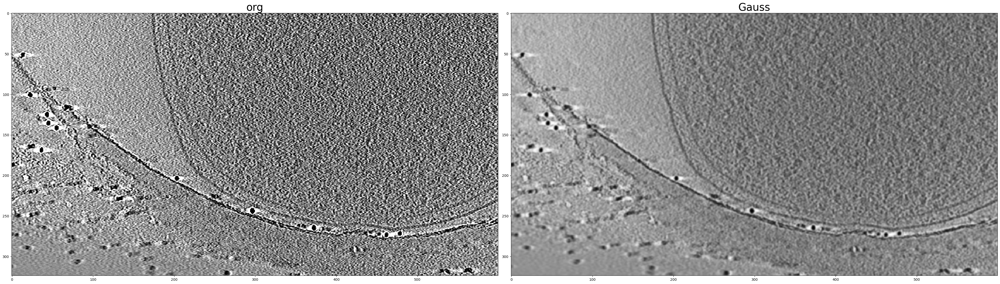

In [10]:
from scipy.ndimage import gaussian_filter

filter_ = (
    test_img.shape[0] / down_sample[0]
)  # Scaling factor; filter_ = 200 / 493 = 0.406
img_ = gaussian_filter(test_img, filter_ / 2)
print(filter_)

slice_ = 100
show_image_list(
    [test_img[slice_, :], img_[slice_, :]],
    num_cols=3,
    list_titles=["org", "Gauss"],
    grid=False,
    figsize=(40, 40),
)

In [12]:
from tardis_em.utils.visualize_pc import show_image_list

slice_ = 50
slice_up = int(slice_ * org_px / 8)
slice_down = int(slice_ * org_px / 25)

show_image_list(
    [
        test_img[slice_, :],
        org_up_linear[slice_up, :],
        org_up_area[slice_up, :],
        # org_up_lanczos[slice_up, :],
        org_up_nn[slice_up, :],
        org_up_nng[slice_up, :],
        # org_up_fft[slice_up, :],
    ],
    num_cols=3,
    list_titles=["org", "Linear", "area", "nn", "nn+Gauss"],
    grid=False,
    figsize=(70, 40),
    dpi=300,
)

In [6]:
import tifffile.tifffile as tiff

tiff.imwrite("../../../org.tif", test_img)
tiff.imwrite("../../../org_down_linear.tif", org_down_linear)
tiff.imwrite("../../../org_down_area.tif", org_down_area)
# tiff.imwrite("../../../org_down_lanczos.tif", org_down_lanczos)
tiff.imwrite("../../../org_down_nn.tif", org_down_nn)
tiff.imwrite("../../../org_down_nng.tif", org_down_nng)
# tiff.imwrite("../../../org_down_fft.tif", org_down_fft)

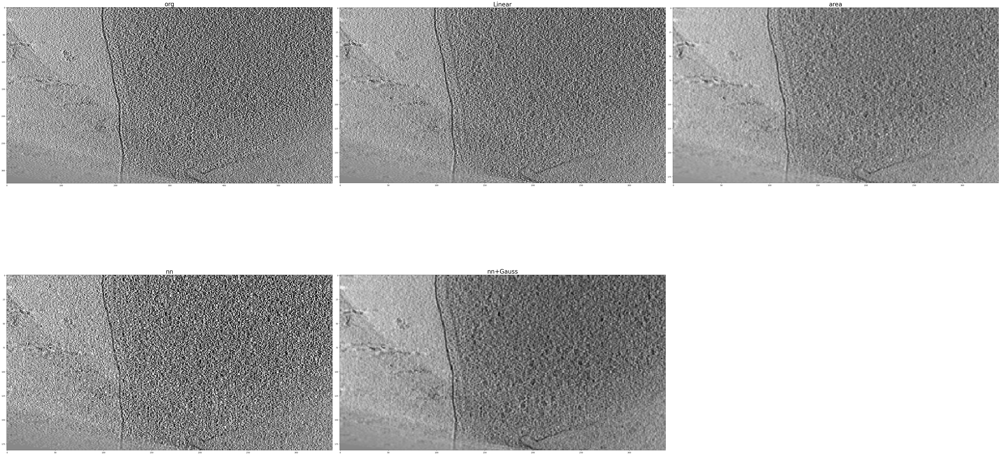

In [13]:
from tardis_em.utils.visualize_pc import show_image_list

slice_ = 45
slice_down = int(round(slice_ * org_px / 25, 0)) - 10

show_image_list(
    [
        test_img[slice_, :],
        org_down_linear[slice_down, :],
        org_down_area[slice_down, :],
        # org_down_lanczos[slice_down, :],
        org_down_nn[slice_down, :],
        org_down_nng[slice_down, :],
        # org_down_fft[slice_down, :],
    ],
    num_cols=3,
    list_titles=["org", "Linear", "area", "nn", "nn+Gauss"],
    grid=False,
    figsize=(70, 40),
    dpi=100,
)

# Scale for mask files

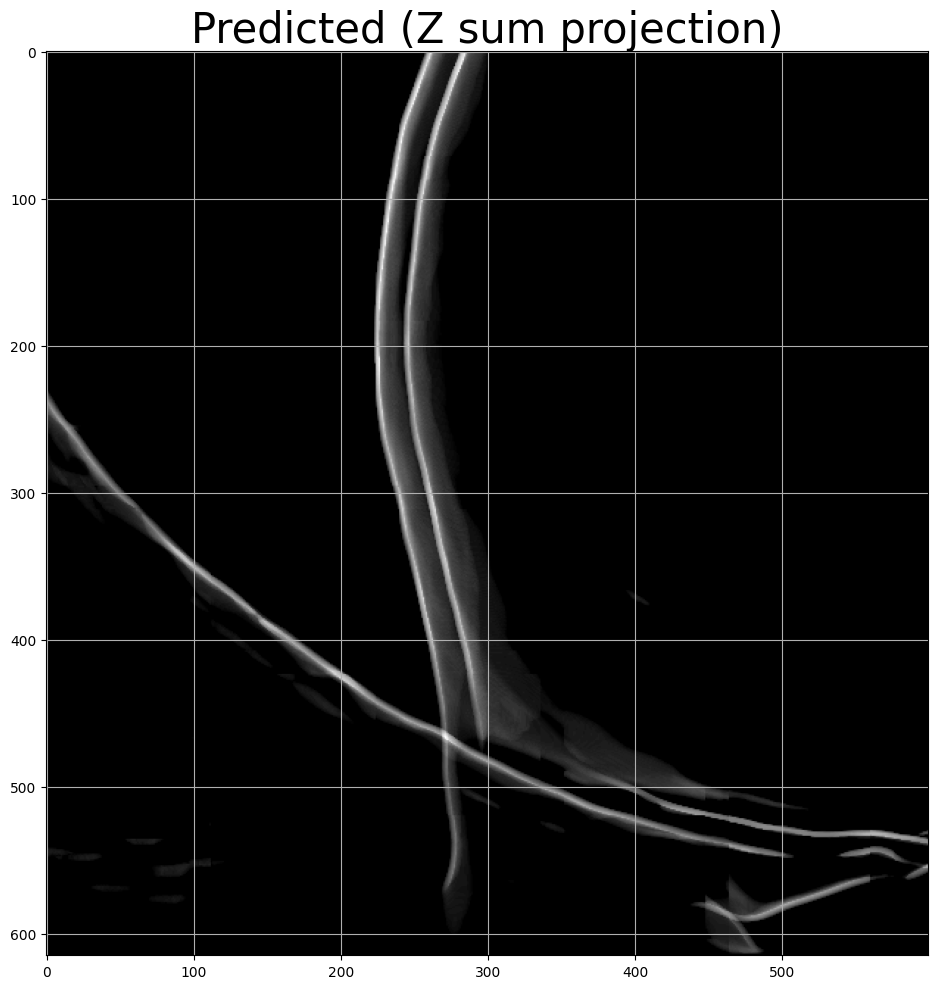

In [14]:
mask = segmented_sigmoid[150:350, 600:, :600]
mask = np.where(mask >= 0.25, 1, 0).astype(np.uint8)
show_image_list([np.sum(mask, 0)], list_titles=["Predicted (Z sum projection)"])

In [15]:
from tardis_em.cnn.data_processing.scaling import (
    linear_scaling,
    area_scaling,
    nn_scaling,
    fourier_scaling,
)

# Upsample to 8A
up_sample = tuple(np.multiply(mask.shape, org_px / 8).astype(np.uint16))
print(f"Up: {up_sample}")
#
mask_up_linear = linear_scaling(mask, up_sample)
mask_up_area = area_scaling(mask, up_sample)
# mask_up_lanczos = pil_LANCZOS(mask, up_sample)
mask_up_nn = nn_scaling(mask, up_sample)
mask_up_nng = nn_scaling(mask, up_sample, gauss=True)
mask_up_fft = fourier_scaling(mask, up_sample)

# Downsample to 25A
down_sample = tuple(np.multiply(mask.shape, org_px / 35).astype(np.uint16))
print(f"Down: {down_sample}")

mask_down_linear = linear_scaling(mask, down_sample)
mask_down_area = area_scaling(mask, down_sample)
# mask_down_lanczos = pil_LANCZOS(mask, down_sample)
mask_down_nn = nn_scaling(mask, down_sample)
mask_down_nng = nn_scaling(mask.astype(np.float32), down_sample, gauss=True)
# mask_down_fft = fourier_scaling(mask, down_sample)

Up: (np.uint16(493), np.uint16(1516), np.uint16(1479))
Down: (np.uint16(112), np.uint16(346), np.uint16(338))


RuntimeError: The expanded size of the tensor (0) must match the existing size (338) at non-singleton dimension 2.  Target sizes: [0, 0, 0].  Tensor sizes: [112, 346, 338]

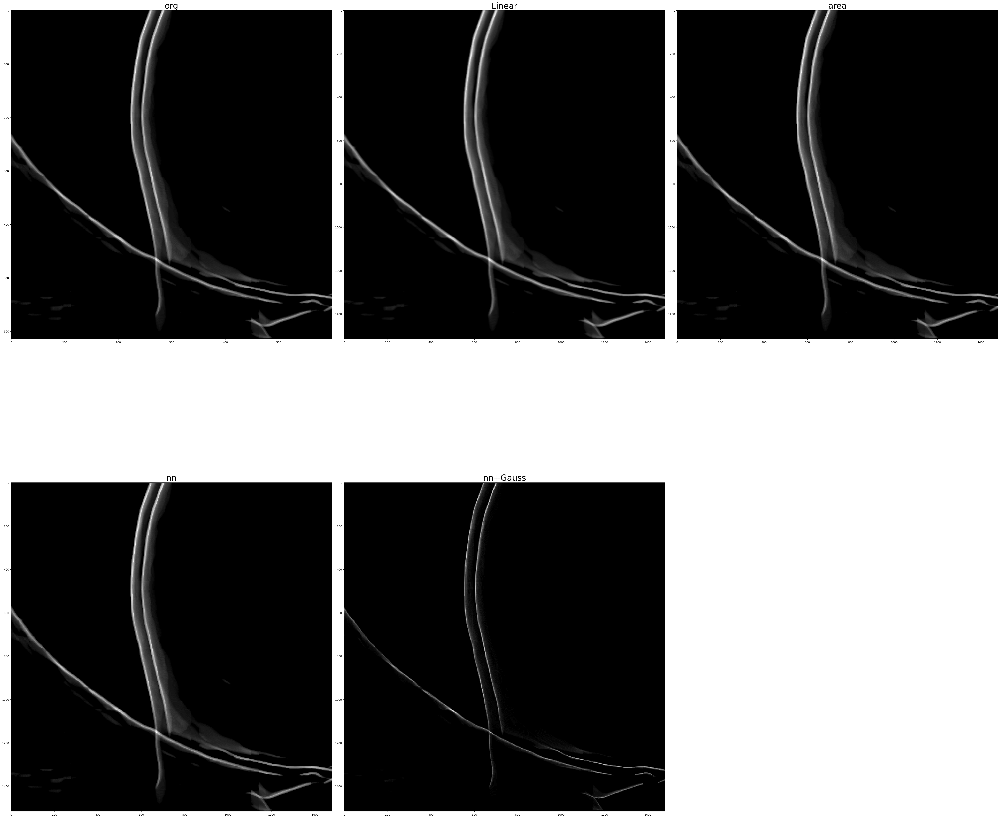

In [17]:
from tardis_em.utils.visualize_pc import show_image_list

show_image_list(
    [
        np.sum(mask, 0),
        np.sum(mask_up_linear, 0),
        np.sum(mask_up_area, 0),
        # np.sum(mask_up_lanczos, 0),
        np.sum(mask_up_nn, 0),
        np.sum(mask_up_nng, 0),
        # np.sum(mask_up_fft, 0),
    ],
    num_cols=3,
    list_titles=["org", "Linear", "area", "nn", "nn+Gauss"],
    grid=False,
    figsize=(50, 50),
)

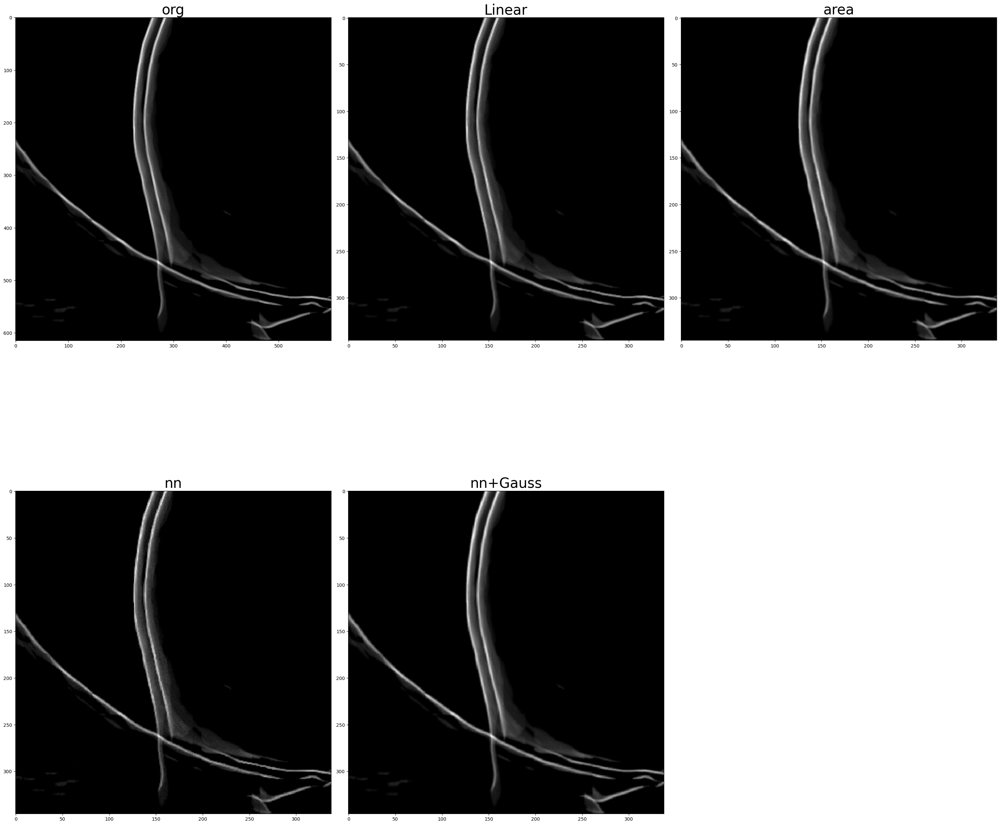

In [18]:
from tardis_em.utils.visualize_pc import show_image_list

show_image_list(
    [
        np.sum(mask, 0),
        np.sum(mask_down_linear, 0),
        np.sum(mask_down_area, 0),
        # np.sum(mask_down_lanczos, 0),
        np.sum(mask_down_nn, 0),
        np.sum(mask_down_nng, 0),
        # np.sum(mask_down_fft, 0),
    ],
    num_cols=3,
    list_titles=["org", "Linear", "area", "nn", "nn+Gauss"],
    grid=False,
    figsize=(30, 30),
)

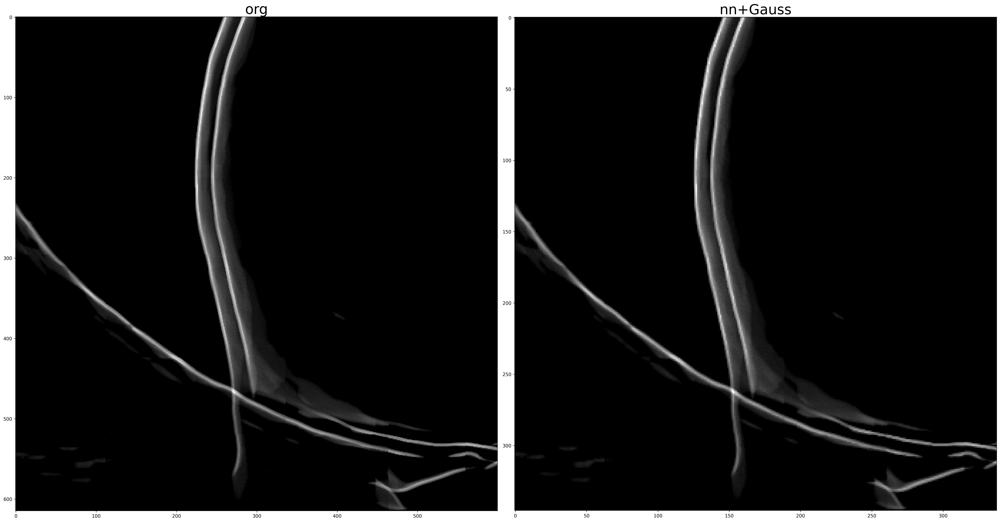

In [25]:
show_image_list(
    [np.sum(mask, 0), np.sum(mask_down_linear, 0)],
    num_cols=3,
    list_titles=["org", "nn+Gauss"],
    grid=False,
    figsize=(30, 30),
    dpi=300,
)

In [21]:
from tardis_em.utils.normalization import adaptive_threshold

seg_th = np.where(segmented_sigmoid >= 0.25, 1, 0).astype(np.uint8)
seg_ad_th = adaptive_threshold(segmented_sigmoid)

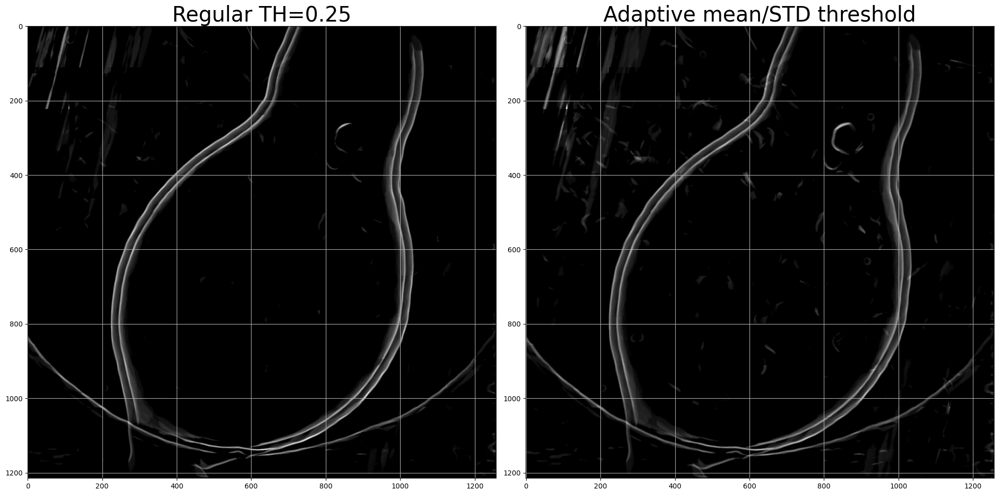

In [22]:
show_image_list(
    [np.sum(seg_th, 0), np.sum(seg_ad_th, 0)],
    num_cols=3,
    figsize=(20, 10),
    list_titles=["Regular TH=0.25", "Adaptive mean/STD threshold"],
)

In [23]:
from tardis_em.dist_pytorch.utils.build_point_cloud import BuildPointCloud

pc = BuildPointCloud()

pc_th = pc.build_point_cloud(seg_th, as_2d=True)
pc_adap = pc.build_point_cloud(seg_ad_th, as_2d=True)

In [22]:
from tardis_em.utils.visualize_pc import VisualizePointCloud

VisualizePointCloud(pc_th, False, None, False)
VisualizePointCloud(pc_adap, False, None, False)

In [8]:
import torch
from tardis_em.cnn.cnn import build_cnn_network

model_dict = torch.load(
    "../../../../../.tardis_em/fnet_attn_32/microtubules_3d/model_weights.pth",
    map_location="cpu",
)
struct = model_dict["model_struct_dict"]
model = build_cnn_network(
    network_type=struct["cnn_type"],
    structure=struct,
    img_size=96,
    prediction=True,
)
model.load_state_dict(model_dict["model_state_dict"])
model.eval()

FNet(
  (encoder): ModuleList(
    (0): EncoderBlock(
      (dropout_layer): Dropout(p=0.5, inplace=False)
      (conv_module): DoubleConvolution(
        (DoubleConv1): SingleConvolution(
          (GroupNorm2): GroupNorm(1, 1, eps=1e-05, affine=True)
          (Conv3D): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
          (LeakyReLu): LeakyReLU(negative_slope=0.1)
        )
        (DoubleConv2): SingleConvolution(
          (GroupNorm2): GroupNorm(8, 16, eps=1e-05, affine=True)
          (Conv3D): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
          (LeakyReLu): LeakyReLU(negative_slope=0.1)
        )
      )
      (attn_conv): DoubleConvolution(
        (DoubleConv1): SingleConvolution(
          (GroupNorm2): GroupNorm(1, 33, eps=1e-05, affine=True)
          (Conv3D): Conv3d(33, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
          (LeakyReLu): LeakyReLU(negative

In [9]:
torch.save(model, "mode.pth")

In [30]:
import requests

r = requests.get(
    "https://tardis-weigths.s3.dualstack.us-east-1.amazonaws.com/",
)
r = r.content.decode("utf-8")

In [35]:
r.split("Key")
r.split("Key")[5]
all_version = [
    f[1:-3].split("/")[-1]
    for f in r.split("Key")
    if f.startswith(">tardis_em/fnet_attn_32/membrane_3d/V_")
]
all_version = [v for v in all_version if v.startswith("V_")]

In [46]:
max([int(v.split("_")[1]) for v in all_version])

10

In [45]:
all_version.append("V_10")

In [40]:
import boto3

client = boto3.client("s3")
result = client.list_objects(Bucket="tardis-weights", Prefix="tardis_em", Delimiter="/")
for o in result.get("CommonPrefixes"):
    print("sub folder : ", o.get("Prefix"))

NoCredentialsError: Unable to locate credentials

In [4]:
from tardis_em.cnn.utils.build_cnn import UNet, FNet
import torch

cnn = UNet(img_patch_size=16, layer_components="2gcl")
fnet = FNet(img_patch_size=16, layer_components="2gcl")

In [5]:
torch.save(cnn, "cnn.pth")
torch.save(fnet, "fnet.pth")

In [6]:
df_raw_64 = torch.rand((1, 1, 64, 64))
df_raw_16 = torch.rand((1, 1, 16, 16))

In [7]:
import torch

cnn.eval()

df_16 = fnet(df_raw_16)
fnet.update_patch_size(64)
cnn.update_patch_size(64)
df_64 = fnet(df_raw_64)

In [8]:
cnn_l = torch.load("cnn.pth")
fnet_l = torch.load("fnet.pth")

In [10]:
df_l_16 = fnet_l(df_raw_16)
fnet_l.update_patch_size(64)
cnn_l.update_patch_size(64)
df_l_64 = fnet_l(df_raw_64)

In [13]:
torch.all(df_l_64 == df_64)

tensor(True)

In [2]:
import torch

weights = torch.load("../../../../../Downloads/model_weights.pth", map_location="cpu")
structure = weights["model_struct_dict"]

In [3]:
from tardis_em.cnn.cnn import build_cnn_network

model = build_cnn_network(
    network_type=structure["cnn_type"],
    structure=structure,
    img_size=96,
    prediction=True,
)

In [4]:
torch.save(model, "model_weights.pth")

In [1]:
from tardis_em.utils.aws import get_weights_aws
import torch

weights = torch.load(
    get_weights_aws("fnet_attn", "32", "membrane_3d", None),
    map_location="cpu",
)

In [2]:
isinstance(weights, dict)

False

In [18]:
df = torch.load("../../../../../Downloads/model_weights.pth", map_location="cpu")

In [20]:
isinstance(df, dict)

True

In [22]:
from tardis_em.cnn.utils.utils import check_model_dict

check_model_dict(df["model_struct_dict"])

{'cnn_type': 'fnet_attn',
 'classification': False,
 'in_channel': 1,
 'out_channel': 1,
 'img_size': 96,
 'dropout': 0.5,
 'num_conv_layers': 5,
 'conv_scaler': 32,
 'conv_kernel': 3,
 'conv_padding': 1,
 'maxpool_kernel': 2,
 'layer_components': '3gcl',
 'attn_features': True,
 'num_group': 8}

In [41]:
from tardis_em.utils.predictor import Predictor

model = Predictor(
    checkpoint=None,
    network="fnet_attn",
    subtype="32",
    model_type="membrane_3d",
    model_version=None,
    img_size=128,
    sigmoid=False,
    device="cpu",
)

Searching for weight file for fnet_attn_32...
Pre-Trained model download from S3 and saved/updated in /Users/robertkiewisz/.tardis_em/fnet_attn_32/membrane_3d


In [35]:
import torch

torch.save(model.model, "model_weights.pth")

In [46]:
# torch.save(model.model, 'model_weights.pth')
model = torch.load(
    "../../../../../.tardis_em/fnet_attn_32/membrane_3d/model_weights.pth",
    map_location="cpu",
)
img_pred_2 = model(torch.from_numpy(img)[None, None, :]).detach().numpy()[0, 0, :]

In [33]:
import tifffile.tifffile as tiff
import torch

img = tiff.imread("local/0_1_4_3_16.tif")

In [55]:
img_pred = model.predict(x=torch.from_numpy(img)[None, None, :], rotate=False)

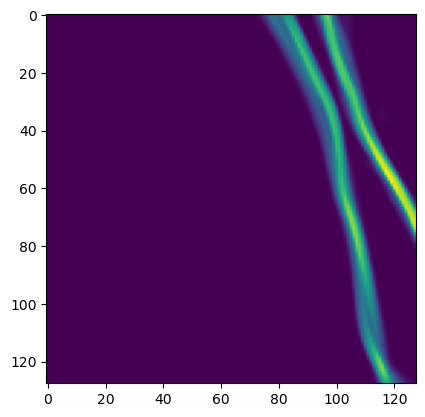

In [56]:
import matplotlib.pyplot as plt
import numpy as np

plt.imshow(np.sum(img_pred_2, 0))

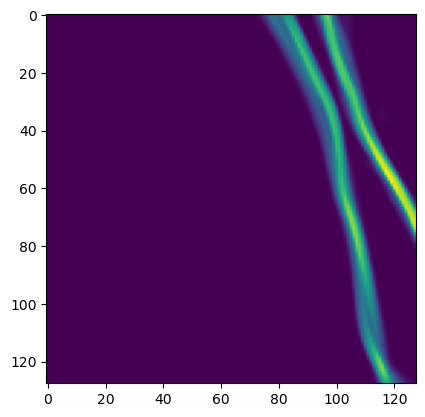

In [59]:
import matplotlib.pyplot as plt
import numpy as np

img_pred = torch.sigmoid(torch.from_numpy(img_pred)).detach().numpy()
plt.imshow(np.sum(img_pred, 0))

In [4]:
semantic_header = [
    (f"CNN type: fnet_attn V1 " f"Image patch size used for CNN: 96"),
    f"CNN threshold: 0.25",
    f"CNN predicted with 4x 90 degrees rotations: True",
]

from tardis_em.utils.export_data import to_mrc
import numpy as np

df = np.random.random((500, 100, 250)).astype(np.int8)

to_mrc(
    data=df,
    file_dir="_semantic.mrc",
    pixel_size=7.34,
    label=semantic_header,
)

In [7]:
["# " + h if not h.startswith("#") else h for h in semantic_header]

['# CNN type: fnet_attn V1 Image patch size used for CNN: 96',
 '# CNN threshold: 0.25',
 '# CNN predicted with 4x 90 degrees rotations: True']

In [16]:
"\n ".join(semantic_header)

'CNN type: fnet_attn V1 Image patch size used for CNN: 96 \n CNN threshold: 0.25 \n CNN predicted with 4x 90 degrees rotations: True'

In [11]:
import requests

r = requests.get(
    "https://tardis-weigths.s3.dualstack.us-east-1.amazonaws.com/",
)
r = r.content.decode("utf-8")
all_version = [
    f[1:-3].split("/")[-1]
    for f in r.split("Key")
    if f.startswith(f">tardis_em/dist_triang/3d/V_")
]
all_version = [v for v in all_version if v.startswith("V_")]
# version = f"V_{max([int(v.split('_')[1]) for v in all_version])}"
# version

In [9]:
from tardis_em.dist_pytorch.dist import build_dist_network
import torch

structure = torch.load(
    "../../../../../Downloads/model_weights-3.pth", map_location="cpu"
)

model = build_dist_network(
    network_type=structure["model_struct_dict"]["dist_type"],
    structure=structure["model_struct_dict"],
    prediction=True,
)

In [10]:
torch.save(model, "model_weights.pth")

In [ ]:
import torch
import numpy as np

from tardis_em.utils.load_data import load_image
from tardis_em.utils.visualize_pc import show_image_list
from tardis_em.cnn.data_processing.scaling import scale_image

img, px = load_image("../../../../emd_23622.map")
mask, _ = load_image("../../../../emd_23622_mask.tif")

scale_ = np.multiply(img.shape, px / 15)

: 

In [ ]:
img_sc, mask_sc, _ = scale_image(scale_, img, mask, "cpu")

In [3]:
from tardis_em.utils.load_data import load_mrc_file, mrc_read_header

mrc_read_header("../../../00011.mrc")

MRCHeader(nx=928, ny=928, nz=180, mode=1, nxstart=0, nystart=0, nzstart=0, mx=928, my=928, mz=180, xlen=12806.400390625, ylen=12806.400390625, zlen=2484.0, alpha=90.0, beta=90.0, gamma=90.0, mapc=1, mapr=2, maps=3, amin=-245.0, amax=200.0, amean=1.5374927520751953, ispg=0, next=0, creatid=0, nint=0, nreal=0, imodStamp=0, imodFlags=0, idtype=0, lens=0, nd1=0, nd2=0, vd1=0, vd2=0, tilt_ox=0.0, tilt_oy=0.0, tilt_oz=0.0, tilt_cx=0.0, tilt_cy=0.0, tilt_cz=0.0, xorg=0.0, yorg=0.0, zorg=0.0, cmap=b'MAP\x00', stamp=b'DD\x00\x00', rms=9.045541763305664, nlabl=1, labels=b'Predicted with TARDIS 0.2.4                        Tue May 14 12:40:45 2024\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00

In [2]:
import torch

w = torch.load("/Users/robertkiewisz/Google Drive/My Drive/NYSBC/TEST_DATA/unet_checkpoint.pth", map_location="cpu", weights_only=False)